In [1]:
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.cuda
import torchvision.transforms.functional as TF
import torchvision.transforms as transforms
import os
import random
from joblib import dump, load
from time import time
from PIL import Image
from tqdm.notebook import tqdm
from torch.nn.functional import relu
from torch.utils.data import DataLoader, Dataset
from sklearn.manifold import TSNE
from SHG import SHG
from utils import *
from skimage.transform import resize
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.base import clone
from sklearn_extra.cluster import KMedoids

In [2]:
# Input images
TRAIN_IMGS_PATH = "C:/Users/André/OneDrive 2/OneDrive/Skrivebord/bsc_data/train/image/"

# Ground truth heatmaps
TRAIN_HEATMAPS_PATH = "C:/Users/André/OneDrive 2/OneDrive/Skrivebord/bsc_data/train/heatmaps/"

# Path for model
MODEL_DIR = "C:/Users/André/OneDrive 2/OneDrive/Skrivebord/bsc_data/models/Mon_Apr_12_18-11-59_2021/epoch_46.pth"

# Path for mean rgb
average_rgb = np.loadtxt("./average_rgb.npy")

# Saving path
SAVING_PATH = "C:/Users/André/OneDrive 2/OneDrive/Skrivebord/bsc_data/latent_space/"

In [3]:
class dataset(Dataset):
    def __init__(self, X_path, y_path, average_rgb):
        self.X_path = X_path
        self.y_path = y_path
        self.X_data = os.listdir(self.X_path)
        self.average_rgb = average_rgb
        self.norm = transforms.Normalize(mean = self.average_rgb, std = [1, 1, 1])
        self.order = ['0.npy', '1.npy', '10.npy', '11.npy', '12.npy', '13.npy', '14.npy', '15.npy', '16.npy', '2.npy', '3.npy', '4.npy', '5.npy', '6.npy', '7.npy', '8.npy', '9.npy']

    def __len__(self):
        return len(self.X_data)

    def __getitem__(self, i):
        ID = self.X_data[i]
        x = Image.open(self.X_path + ID)

        y = []

        for i in range(17):
            y.append(torch.from_numpy(np.load(self.y_path + ID[:-4] + "/" + str(i) + ".npy")))

        x = TF.to_tensor(x)

        if (x.shape[0] == 1): # If the image is gray-scale, cast it to rgb
            x = torch.stack((x[0],) * 3)

        x = self.norm(x) # Subtracts mean rgb

        y = torch.stack(y)
        return x, y, ID

train_data = dataset(TRAIN_IMGS_PATH, TRAIN_HEATMAPS_PATH, average_rgb)
train_dataloader = DataLoader(train_data, batch_size = 1, shuffle = True)

In [4]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = SHG(num_hourglasses=1).to(device)
model.load_state_dict(torch.load(MODEL_DIR))
model.eval()
print("")

In [5]:
NUM_DATAPOINTS = 10000

bottleneck_arr = []
gt_heatmaps = []
IDs = []

with torch.no_grad():
    for x, y, id_ in tqdm(train_dataloader):
        x = x.to(device, dtype = torch.float)

        if (0 in np.array(turn_featuremaps_to_keypoints(y)).reshape((3, -1))[:, -1]):
            continue

        _, bottleneck = model(x)

        bottleneck_arr.append(bottleneck[2].cpu().data.numpy().flatten())
        gt_heatmaps.append(turn_featuremaps_to_keypoints(y))
        IDs.append(id_)
        print(len(bottleneck_arr))

        if (len(bottleneck_arr) == NUM_DATAPOINTS):
            break

bottleneck_arr = np.array(bottleneck_arr).reshape((NUM_DATAPOINTS, -1))
gt_heatmaps = np.array(gt_heatmaps).reshape((NUM_DATAPOINTS, -1))
#dump(IDs, SAVING_PATH + str(NUM_DATAPOINTS) + "/" + "IDs.joblib") # Saving the IDs of the images worked on

01
6002
6003
6004
6005
6006
6007
6008
6009
6010
6011
6012
6013
6014
6015
6016
6017
6018
6019
6020
6021
6022
6023
6024
6025
6026
6027
6028
6029
6030
6031
6032
6033
6034
6035
6036
6037
6038
6039
6040
6041
6042
6043
6044
6045
6046
6047
6048
6049
6050
6051
6052
6053
6054
6055
6056
6057
6058
6059
6060
6061
6062
6063
6064
6065
6066
6067
6068
6069
6070
6071
6072
6073
6074
6075
6076
6077
6078
6079
6080
6081
6082
6083
6084
6085
6086
6087
6088
6089
6090
6091
6092
6093
6094
6095
6096
6097
6098
6099
6100
6101
6102
6103
6104
6105
6106
6107
6108
6109
6110
6111
6112
6113
6114
6115
6116
6117
6118
6119
6120
6121
6122
6123
6124
6125
6126
6127
6128
6129
6130
6131
6132
6133
6134
6135
6136
6137
6138
6139
6140
6141
6142
6143
6144
6145
6146
6147
6148
6149
6150
6151
6152
6153
6154
6155
6156
6157
6158
6159
6160
6161
6162
6163
6164
6165
6166
6167
6168
6169
6170
6171
6172
6173
6174
6175
6176
6177
6178
6179
6180
6181
6182
6183
6184
6185
6186
6187
6188
6189
6190
6191
6192
6193
6194
6195
6196
6197
6198
6199
6200
62

In [6]:
""" Finding explained variance of each component """ 
pca = PCA(n_components = bottleneck_arr.shape[1]).fit(bottleneck_arr)

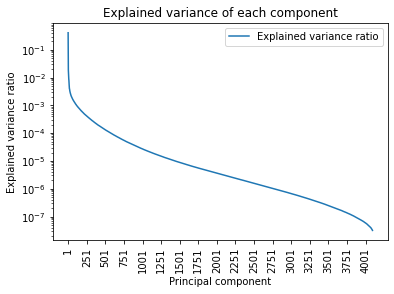

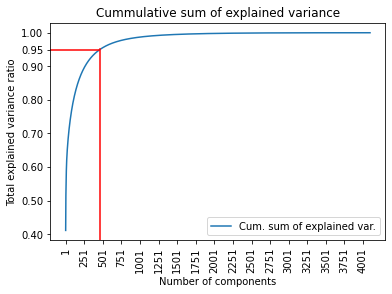

In [7]:
""" PCA PLOTS """

plt.figure()
plt.title("Explained variance of each component")
plt.xlabel("Principal component")
plt.ylabel("Explained variance ratio")
plt.plot(np.arange(0, bottleneck_arr.shape[1]), pca.explained_variance_ratio_, label = "Explained variance ratio")
plt.legend()
plt.xticks(np.arange(1, bottleneck_arr.shape[1] + 1, 250), rotation = 90)
plt.yscale("log")
#plt.savefig(SAVING_PATH + "explained_var_ratio.png")
plt.show()

plt.figure()
plt.title("Cummulative sum of explained variance")
plt.xlabel("Number of components")
plt.ylabel("Total explained variance ratio")
plt.plot(np.arange(0, bottleneck_arr.shape[1]), np.cumsum(pca.explained_variance_ratio_), label = "Cum. sum of explained var.")
plt.axhline(y=0.95, color='r', linestyle='-', xmax = 600/len(pca.explained_variance_ratio_))
plt.axvline(x=464, color='r', linestyle='-', ymax = 0.88)
plt.legend()
plt.xticks(np.arange(1, bottleneck_arr.shape[1] + 1, 250), rotation = 90)
plt.yticks(np.append(np.arange(0.4, 1.1, 0.1), 0.95))
#plt.savefig(SAVING_PATH + "cum_explained_var_ratio.png")
plt.show()

In [16]:
""" PCA TRANSFORMATION WITH 2 COMPONENTS"""

NUM_COMPONENTS = 2
pca_bottleneck = pca.transform(bottleneck_arr)[:, :NUM_COMPONENTS]
print("Explained variance", sum(pca.explained_variance_ratio_[:NUM_COMPONENTS]))

#dump(pca, SAVING_PATH + str(NUM_DATAPOINTS) + "/" + str(NUM_COMPONENTS) + "/" + "pca.joblib".format(NUM_COMPONENTS))
#dump(pca_bottleneck, SAVING_PATH + str(NUM_DATAPOINTS) + "/" + str(NUM_COMPONENTS) + "/" + "pca_bottleneck.joblib")

Explained variance 0.4692685753107071


In [9]:
""" t-SNE TRANSFORMATION WITH 2 COMPONENTS"""

tsne_bottleneck = TSNE(n_components=NUM_COMPONENTS, learning_rate=500, perplexity = 20).fit_transform(bottleneck_arr)

#dump(tsne_bottleneck, SAVING_PATH + str(NUM_DATAPOINTS) + "/" + str(NUM_COMPONENTS) + "/" + "tsne_bottleneck.joblib")

In [10]:
""" Parameters for making 2D plots """

zoom = 0.5
fig_size = (20, 15)

<Figure size 1440x1080 with 0 Axes>

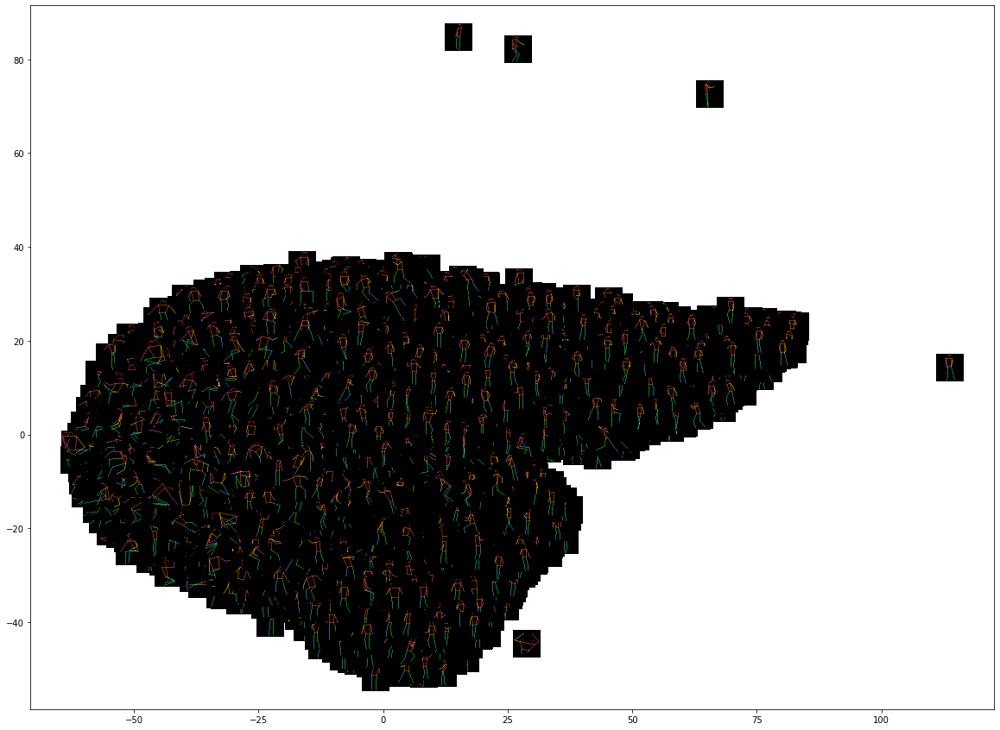

In [11]:
""" t-SNE plot """

plt.figure(figsize = fig_size)

fig, ax = plt.subplots(figsize = fig_size)
for tsne, img in zip(tsne_bottleneck, gt_heatmaps):
    image = draw_skeleton(np.round(img))
    im = OffsetImage(image, zoom = zoom)
    ab = AnnotationBbox(im, (tsne[0], tsne[1]), xycoords = "data", frameon = False)
    ax.add_artist(ab)
    ax.update_datalim([(tsne[0], tsne[1])])
    ax.autoscale()

#plt.savefig(SAVING_PATH + str(NUM_DATAPOINTS) + "/" + str(NUM_COMPONENTS) + "/" + "tsne.png")
plt.show()

<Figure size 1440x1080 with 0 Axes>

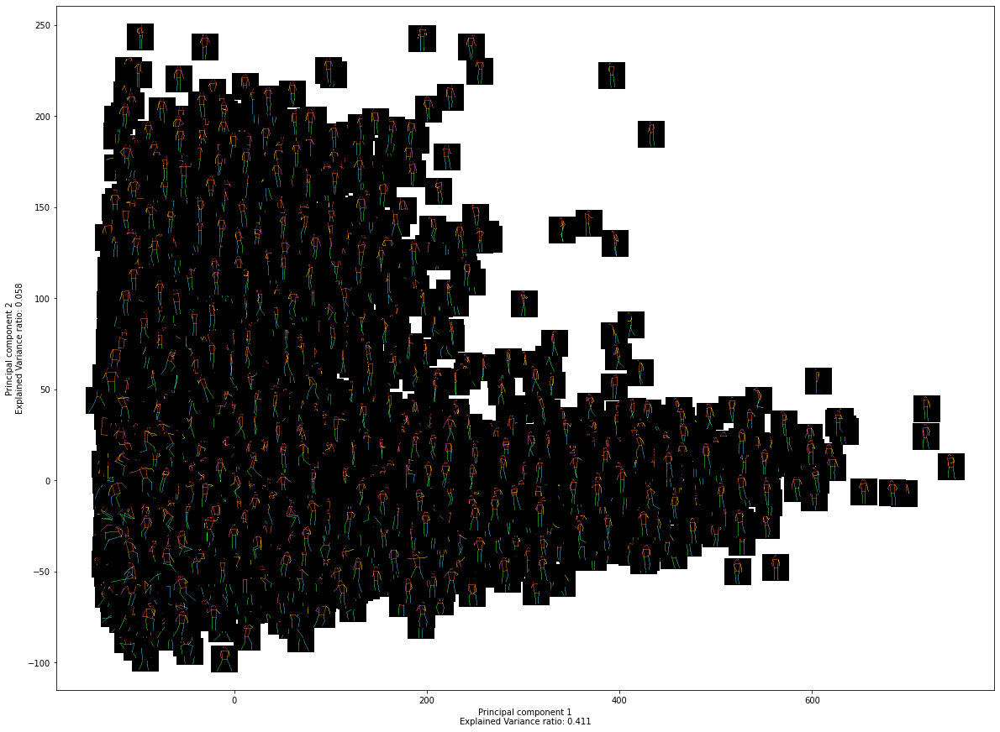

In [18]:
""" PCA plot """

plt.figure(figsize = fig_size)

fig, ax = plt.subplots(figsize = fig_size)
for pca_res, img in zip(pca_bottleneck, gt_heatmaps):
    image = draw_skeleton(np.round(img))
    im = OffsetImage(image, zoom = zoom)
    ab = AnnotationBbox(im, (pca_res[0], pca_res[1]), xycoords = "data", frameon = False)
    ax.add_artist(ab)
    ax.update_datalim([(pca_res[0], pca_res[1])])
    ax.autoscale()

plt.xlabel("Principal component 1\nExplained Variance ratio: {:.3f}".format(pca.explained_variance_ratio_[0]))
plt.ylabel("Principal component 2\nExplained Variance ratio: {:.3f}".format(pca.explained_variance_ratio_[1])) 
#plt.savefig(SAVING_PATH + str(NUM_DATAPOINTS) + "/" + str(NUM_COMPONENTS) + "/" + "pca.png")
plt.show()

In [10]:
""" Prameters for KMeans"""
Ks = np.arange(2, 21, 1)
NUM_reruns = 5

Text(0, 0.5, 'Silhouette score')

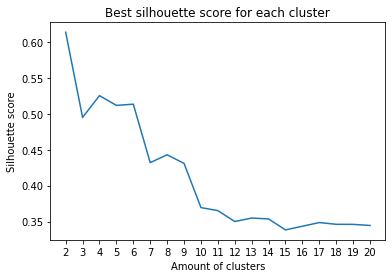

In [20]:
""" Fitting KMeans with 2 components on 2D PCA data """
pca_sil = []
best_kmeans_model = None
overall_best_sil = -1

for k in tqdm(Ks, desc = "k"):
    cur_best_sil = -1
    for i in tqdm(range(NUM_reruns), leave = False, desc = "run"):
        #kmeans = KMeans(n_clusters=k).fit(pca_bottleneck)
        kmeans = KMedoids(n_clusters=k).fit(pca_bottleneck)
        labels = kmeans.labels_
        cur_sil = silhouette_score(pca_bottleneck, labels, metric = 'euclidean')

        if (cur_sil > cur_best_sil):
            cur_best_sil = cur_sil

            if (cur_best_sil > overall_best_sil):
                best_kmeans_model = clone(kmeans)
                overall_best_sil = cur_best_sil

    pca_sil.append(cur_best_sil)

# Plotting silhouette score
pca_sil = np.array(pca_sil)
plt.figure()
plt.plot(np.arange(2, 21, 1), pca_sil, label = "PCA")
plt.xticks(np.arange(2, 21, 1))
plt.title("Best silhouette score for each cluster")
plt.xlabel("Amount of clusters")
plt.ylabel("Silhouette score")
#plt.savefig(SAVING_PATH + str(NUM_DATAPOINTS) + "/" + str(NUM_COMPONENTS) + "/" + "pca_silhouette_score.png")
#dump(best_kmeans_model, SAVING_PATH + str(NUM_DATAPOINTS) + "/" + str(NUM_COMPONENTS) + "/" + "pca_best_kmeans_{}.joblib".format(np.argmax(pca_sil) + 2))


Best silhouette_score: 0.4524182081222534


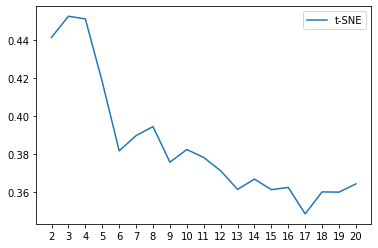

In [21]:
""" Fitting KMeans with 2 components on 2D t-SNE data """

tsne_sil = []
best_kmeans_model = None
overall_best_sil = -1

for k in tqdm(Ks, desc = "k"):
    cur_best_sil = -1
    for i in tqdm(range(NUM_reruns), leave = False, desc = "run"):
        #kmeans = KMeans(n_clusters=k).fit(tsne_bottleneck)
        kmeans = KMedoids(n_clusters=k).fit(tsne_bottleneck)
        labels = kmeans.labels_
        cur_sil = silhouette_score(tsne_bottleneck, labels, metric = 'euclidean')

        if (cur_sil > cur_best_sil):
            cur_best_sil = cur_sil

            if (cur_best_sil > overall_best_sil):
                best_kmeans_model = clone(kmeans)
                overall_best_sil = cur_best_sil

    tsne_sil.append(cur_best_sil)

# Plotting silhouette score
tsne_sil = np.array(tsne_sil)
plt.plot(np.arange(2, 21, 1), tsne_sil, label = "t-SNE")
plt.legend()
plt.xticks(np.arange(2, 21, 1))
#plt.savefig(SAVING_PATH + str(NUM_DATAPOINTS) + "/" + str(NUM_COMPONENTS) + "/" + "tsne_silhouette_score.png")
print("Best silhouette_score: {}".format(np.max(tsne_sil)))
#dump(best_kmeans_model, SAVING_PATH + str(NUM_DATAPOINTS) + "/" + str(NUM_COMPONENTS) + "/" + "tsne_best_kmeans_{}.joblib".format(np.argmax(tsne_sil) + 2))

Best silhouette_score: 0.4524182081222534


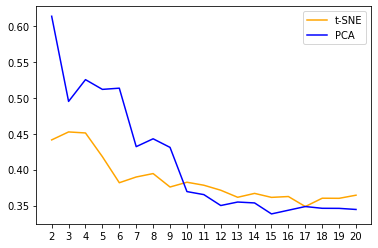

In [22]:
# Comparing PCA and t-SNE silhouette scores
plt.plot(np.arange(2, 21, 1), tsne_sil, c = "orange", label = "t-SNE")
plt.plot(np.arange(2, 21, 1), pca_sil, c = "blue", label = "PCA")
plt.legend()
plt.xticks(np.arange(2, 21, 1))
#plt.savefig(SAVING_PATH + str(NUM_DATAPOINTS) + "/" + str(NUM_COMPONENTS) + "/" + "silhouette_score.png")
print("Best silhouette_score: {}".format(np.max(tsne_sil)))

In [26]:
""" Same procedure for PCA, however, now with n_components = 463, which explains 95% of the variance with pca """
NUM_COMPONENTS = 463
pca_bottleneck = pca.transform(bottleneck_arr)[:, :NUM_COMPONENTS]
print("Explained variance", sum(pca.explained_variance_ratio_[:NUM_COMPONENTS]))

Explained variance 0.9502809889090713


Text(0, 0.5, 'Silhouette score')

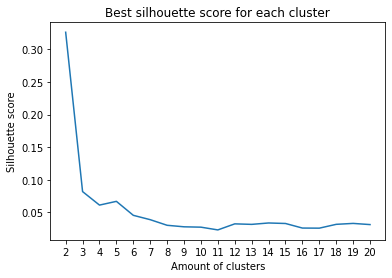

In [27]:
Ks = np.arange(2, 21, 1)
NUM_reruns = 5

""" Fitting KMeans """
pca_sil = []
best_kmeans_model = None
overall_best_sil = -1

for k in tqdm(Ks, desc = "k"):
    cur_best_sil = -1
    for i in tqdm(range(NUM_reruns), leave = False, desc = "run"):
        #kmeans = KMeans(n_clusters=k).fit(pca_bottleneck)
        kmeans = KMedoids(n_clusters=k).fit(pca_bottleneck)
        labels = kmeans.labels_
        cur_sil = silhouette_score(pca_bottleneck, labels, metric = 'euclidean')

        if (cur_sil > cur_best_sil):
            cur_best_sil = cur_sil

            if (cur_best_sil > overall_best_sil):
                best_kmeans_model = clone(kmeans)
                overall_best_sil = cur_best_sil

    pca_sil.append(cur_best_sil)

# Plotting silhouette score
pca_sil = np.array(pca_sil)
plt.figure()
plt.plot(np.arange(2, 21, 1), pca_sil, label = "PCA")
plt.xticks(np.arange(2, 21, 1))
plt.title("Best silhouette score for each cluster")
plt.xlabel("Amount of clusters")
plt.ylabel("Silhouette score")
#plt.savefig(SAVING_PATH + str(NUM_DATAPOINTS) + "/" + str(NUM_COMPONENTS) + "/" + "pca_silhouette_score.png")
#dump(best_kmeans_model, SAVING_PATH + str(NUM_DATAPOINTS) + "/" + str(NUM_COMPONENTS) + "/" + "pca_best_kmeans_{}.joblib".format(np.argmax(pca_sil) + 2))

In [6]:
""" Trying pca with 25.000 samples """

NUM_DATAPOINTS = 25000

bottleneck_arr = []
gt_heatmaps = []
IDs = []

with torch.no_grad():
    for x, y, id_ in tqdm(train_dataloader):
        x = x.to(device, dtype = torch.float)

        if (0 in np.array(turn_featuremaps_to_keypoints(y)).reshape((3, -1))[:, -1]):
            continue

        _, bottleneck = model(x)

        bottleneck_arr.append(bottleneck[2].cpu().data.numpy().flatten())
        gt_heatmaps.append(turn_featuremaps_to_keypoints(y))
        IDs.append(id_)
        print(len(bottleneck_arr))

        if (len(bottleneck_arr) == NUM_DATAPOINTS):
            break

bottleneck_arr = np.array(bottleneck_arr).reshape((NUM_DATAPOINTS, -1))
gt_heatmaps = np.array(gt_heatmaps).reshape((NUM_DATAPOINTS, -1))


21668
21669
21670
21671
21672
21673
21674
21675
21676
21677
21678
21679
21680
21681
21682
21683
21684
21685
21686
21687
21688
21689
21690
21691
21692
21693
21694
21695
21696
21697
21698
21699
21700
21701
21702
21703
21704
21705
21706
21707
21708
21709
21710
21711
21712
21713
21714
21715
21716
21717
21718
21719
21720
21721
21722
21723
21724
21725
21726
21727
21728
21729
21730
21731
21732
21733
21734
21735
21736
21737
21738
21739
21740
21741
21742
21743
21744
21745
21746
21747
21748
21749
21750
21751
21752
21753
21754
21755
21756
21757
21758
21759
21760
21761
21762
21763
21764
21765
21766
21767
21768
21769
21770
21771
21772
21773
21774
21775
21776
21777
21778
21779
21780
21781
21782
21783
21784
21785
21786
21787
21788
21789
21790
21791
21792
21793
21794
21795
21796
21797
21798
21799
21800
21801
21802
21803
21804
21805
21806
21807
21808
21809
21810
21811
21812
21813
21814
21815
21816
21817
21818
21819
21820
21821
21822
21823
21824
21825
21826
21827
21828
21829
21830
21831
21832
21833
218

In [7]:
""" Finding explained variance of each component """ 
pca = PCA(n_components = bottleneck_arr.shape[1]).fit(bottleneck_arr)

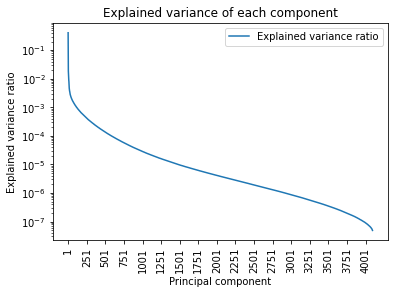

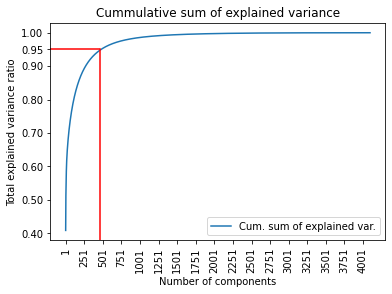

In [36]:
""" PCA PLOTS """

plt.figure()
plt.title("Explained variance of each component")
plt.xlabel("Principal component")
plt.ylabel("Explained variance ratio")
plt.plot(np.arange(0, bottleneck_arr.shape[1]), pca.explained_variance_ratio_, label = "Explained variance ratio")
plt.legend()
plt.xticks(np.arange(1, bottleneck_arr.shape[1] + 1, 250), rotation = 90)
plt.yscale("log")
#plt.savefig(SAVING_PATH + "explained_var_ratio.png")
plt.show()

plt.figure()
plt.title("Cummulative sum of explained variance")
plt.xlabel("Number of components")
plt.ylabel("Total explained variance ratio")
plt.plot(np.arange(0, bottleneck_arr.shape[1]), np.cumsum(pca.explained_variance_ratio_), label = "Cum. sum of explained var.")
plt.axhline(y=0.95, color='r', linestyle='-', xmax = 600/len(pca.explained_variance_ratio_))
plt.axvline(x=464, color='r', linestyle='-', ymax = 0.88)
plt.legend()
plt.xticks(np.arange(1, bottleneck_arr.shape[1] + 1, 250), rotation = 90)
plt.yticks(np.append(np.arange(0.4, 1.1, 0.1), 0.95))
#plt.savefig(SAVING_PATH + "cum_explained_var_ratio.png")
plt.show()

In [37]:
NUM_COMPONENTS = 2
pca_bottleneck = pca.transform(bottleneck_arr)[:, :NUM_COMPONENTS]
print("Explained variance", sum(pca.explained_variance_ratio_[:NUM_COMPONENTS]))

Explained variance 0.46612152084708214


In [38]:
Ks = np.arange(2, 21, 1)
NUM_reruns = 5

Text(0, 0.5, 'Silhouette score')

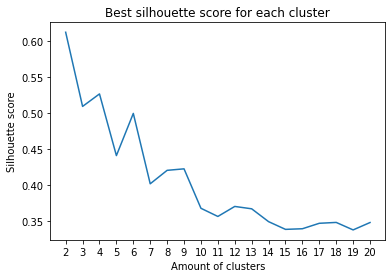

In [39]:
""" Fitting KMeans """
pca_sil = []
best_kmeans_model = None
overall_best_sil = -1

for k in tqdm(Ks, desc = "k"):
    cur_best_sil = -1
    for i in tqdm(range(NUM_reruns), leave = False, desc = "run"):
        #kmeans = KMeans(n_clusters=k).fit(pca_bottleneck)
        kmeans = KMedoids(n_clusters=k).fit(pca_bottleneck)
        labels = kmeans.labels_
        cur_sil = silhouette_score(pca_bottleneck, labels, metric = 'euclidean')

        if (cur_sil > cur_best_sil):
            cur_best_sil = cur_sil

            if (cur_best_sil > overall_best_sil):
                best_kmeans_model = clone(kmeans)
                overall_best_sil = cur_best_sil

    pca_sil.append(cur_best_sil)

# Plotting silhouette score
pca_sil = np.array(pca_sil)
plt.figure()
plt.plot(np.arange(2, 21, 1), pca_sil, label = "PCA")
plt.xticks(np.arange(2, 21, 1))
plt.title("Best silhouette score for each cluster")
plt.xlabel("Amount of clusters")
plt.ylabel("Silhouette score")
#plt.savefig(SAVING_PATH + str(NUM_DATAPOINTS) + "/" + str(NUM_COMPONENTS) + "/" + "pca_silhouette_score.png")
#dump(best_kmeans_model, SAVING_PATH + str(NUM_DATAPOINTS) + "/" + str(NUM_COMPONENTS) + "/" + "pca_best_kmeans_{}.joblib".format(np.argmax(pca_sil) + 2))

In [8]:
""" Same procedure for PCA, however, now with n_components = 480, which explains 95% of the variance with pca """
NUM_COMPONENTS = 480
pca_bottleneck = pca.transform(bottleneck_arr)[:, :NUM_COMPONENTS]
print("Explained variance", sum(pca.explained_variance_ratio_[:NUM_COMPONENTS]))

Explained variance 0.9503485231543891


Text(0, 0.5, 'Silhouette score')

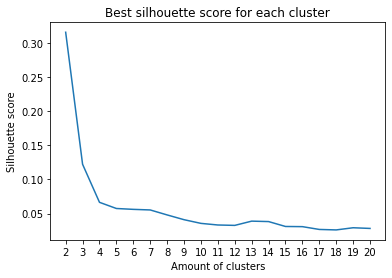

In [11]:
""" Fitting KMeans """
pca_sil = []
best_kmeans_model = None
overall_best_sil = -1

for k in tqdm(Ks, desc = "k"):
    cur_best_sil = -1
    for i in tqdm(range(NUM_reruns), leave = False, desc = "run"):
        #kmeans = KMeans(n_clusters=k).fit(pca_bottleneck)
        kmeans = KMedoids(n_clusters=k).fit(pca_bottleneck)
        labels = kmeans.labels_
        cur_sil = silhouette_score(pca_bottleneck, labels, metric = 'euclidean')

        if (cur_sil > cur_best_sil):
            cur_best_sil = cur_sil

            if (cur_best_sil > overall_best_sil):
                best_kmeans_model = clone(kmeans)
                overall_best_sil = cur_best_sil

    pca_sil.append(cur_best_sil)

# Plotting silhouette score
pca_sil = np.array(pca_sil)
plt.figure()
plt.plot(np.arange(2, 21, 1), pca_sil, label = "PCA")
plt.xticks(np.arange(2, 21, 1))
plt.title("Best silhouette score for each cluster")
plt.xlabel("Amount of clusters")
plt.ylabel("Silhouette score")
#plt.savefig(SAVING_PATH + str(NUM_DATAPOINTS) + "/" + str(NUM_COMPONENTS) + "/" + "pca_silhouette_score.png")
#dump(best_kmeans_model, SAVING_PATH + str(NUM_DATAPOINTS) + "/" + str(NUM_COMPONENTS) + "/" + "pca_best_kmeans_{}.joblib".format(np.argmax(pca_sil) + 2))